# Equipo NNN
**Integrantes:**  
Antonio Elias Sánchez Soto CITEC, BDFC 301 
Nolver Navarro Tamayo  CITEC, BDFC 201

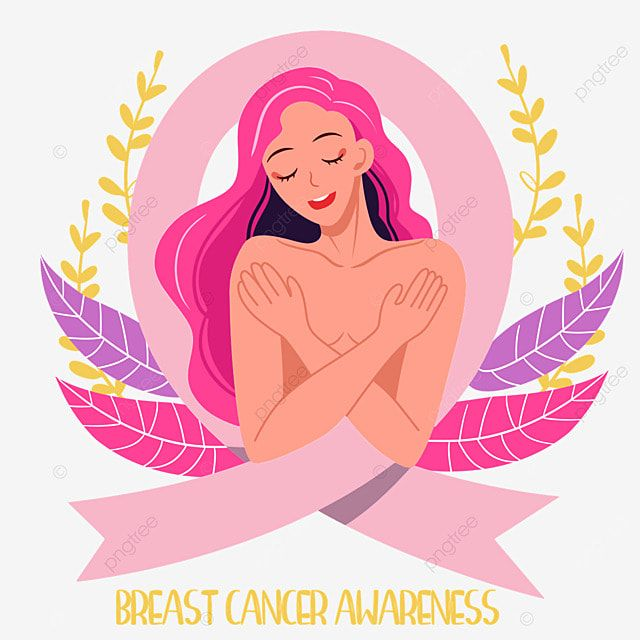

## Situación problemática: Falsos negativos en el diagnóstico de cáncer de mama

El cáncer de mama constituye el 24,5% de los casos oncológicos diagnosticados en mujeres a nivel mundial (Sung et al., 2021). El pronóstico de esta enfermedad depende de manera crítica de su detección precoz, dado que la supervivencia a cinco años alcanza el 98% en estadio I, en contraste con el 27% observado en estadio IV (American Cancer Society, 2023). El diagnóstico histopatológico mediante aspiración con aguja fina (FNA) se reconoce como el estándar inicial para la evaluación de lesiones mamarias; sin embargo, esta técnica presenta limitaciones notables en entornos hospitalarios con elevada carga asistencial.

En instituciones de referencia que procesan más de 200 muestras diarias, la literatura reporta una tasa de falsos negativos aproximada del 8,2% (IC 95%: 6,1–10,3%) en la identificación de tumores malignos (Wolberg et al., 1995). Este fenómeno se atribuye fundamentalmente a la variabilidad interobservador entre patólogos (κ de Cohen = 0,72), la fatiga clínica inherente al análisis de características nucleares sutiles (por ejemplo, concavidad < 0,1) y a las limitaciones en la cuantificación objetiva de atributos morfológicos. Tales errores diagnósticos conllevan retrasos terapéuticos, estimados en 2,3 ± 0,4 meses debido a la necesidad de reclasificación posterior (National Comprehensive Cancer Network, 2022), lo que favorece la progresión tumoral y reduce la supervivencia global de las pacientes.

En este contexto, el presente análisis tiene como objetivo el desarrollo de un modelo robusto de predicción diagnóstica para pacientes con cáncer de mama, empleando técnicas de aprendizaje automático sobre variables morfológicas nucleares. Se busca, de este modo, minimizar la tasa de falsos negativos, incrementar la sensibilidad diagnóstica y contribuir a la optimización del proceso clínico-asistencial.

In [19]:
## Carga del Dataset
import pandas as pd

columnas = ['id', 'diagnosis','radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se','radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']

df = pd.read_csv('wdbc.data', header=None, names=columnas, delimiter=',')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Descripción del Dataset seleccionado (Breast Cancer Wisconsin)

Se emplea el **Breast Cancer Wisconsin (Diagnostic) Dataset** del UCI Machine Learning Repository (Wolberg et al., 1995), ampliamente validado en la literatura científica.

- **Instancias:** 569 muestras de tumores mamarios  
- **Atributos:** 32 columnas (ID, diagnóstico [M: maligno, B: benigno], y 30 características numéricas)  
- **Características:** cada muestra incluye 10 propiedades morfológicas del núcleo celular (radio, textura, perímetro, área, suavidad, compacidad, concavidad, puntos cóncavos, simetría, dimensión fractal), medidas como media, error estándar y peor valor.  
- **Variable objetivo:** diagnosis (M = maligno, B = benigno)  

Este dataset permite el desarrollo de modelos predictivos multivariables para el diagnóstico automatizado, facilitando la detección temprana y objetiva de tumores malignos.


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [21]:
## Preprocesamiento
df = df.drop(columns=['id']) #informacion innecesaria
df['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [22]:
df = df.dropna() # eliminar nulos en caso de existir
df = df.drop_duplicates() # eliminar duplicados en caso de existir

In [23]:
df['diagnosis'] = df['diagnosis'].map({'M':1, 'B':0}) #  1 Maligno, 0 Benigno

<Axes: xlabel='diagnosis', ylabel='count'>

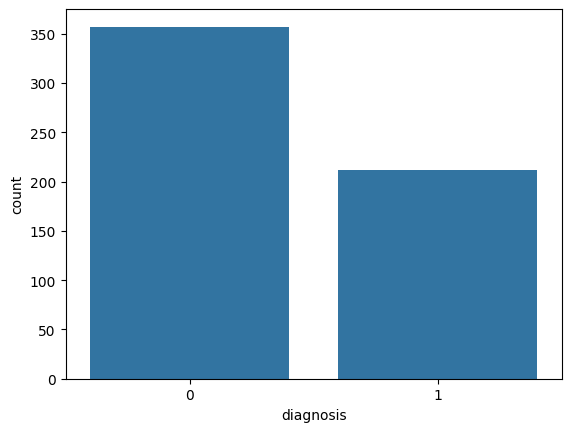

In [24]:
import seaborn as sns 
import matplotlib.pyplot as plt 

sns.countplot(data=df, x='diagnosis')

In [25]:
## Estandarizar dataframe
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

dfScaled = scaler.fit_transform(df)
dfScaled = pd.DataFrame(dfScaled, columns=df.columns)
dfScaled.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,1.297676,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.297676,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.297676,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,1.297676,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.297676,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


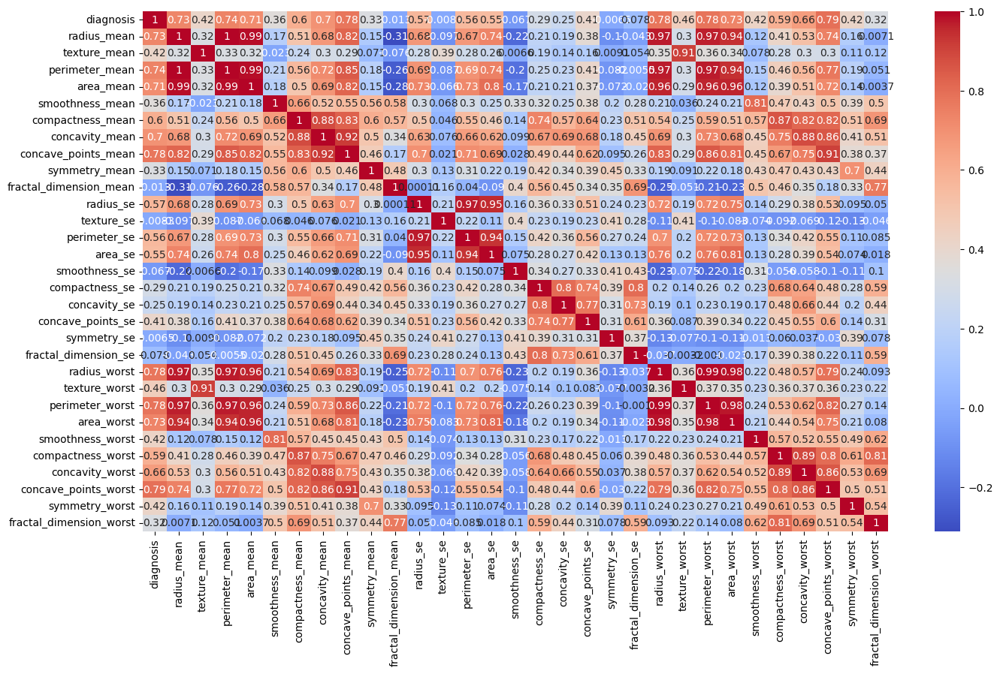

In [26]:
corrMatrix = df.corr(method = 'pearson') # crear matriz de correlacion 

plt.figure(figsize=(16,9))
sns.heatmap(corrMatrix, annot= True, cmap='coolwarm') # el annot es para los números
plt.show()

In [27]:
# Ingenieria de atributos
corrTarget = corrMatrix['diagnosis'].abs() # valores absolutos para comparar
selectFeatures = corrTarget[corrTarget > 0.5].index.drop('diagnosis') # correlacion con el diagnosis mayor a 0.5 o inferior a -0.5

dfSelected = df[selectFeatures.tolist() + ['diagnosis']] # nuevo dataframe con las columnas seleccionadas y el diagnosis
print("Características seleccionadas con correlación > 0.5:")
print(selectFeatures)

Características seleccionadas con correlación > 0.5:
Index(['radius_mean', 'perimeter_mean', 'area_mean', 'compactness_mean',
       'concavity_mean', 'concave_points_mean', 'radius_se', 'perimeter_se',
       'area_se', 'radius_worst', 'perimeter_worst', 'area_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst'],
      dtype='object')


In [28]:
dfSelected.head()

,radius_mean,perimeter_mean,area_mean,compactness_mean,concavity_mean,concave_points_mean,radius_se,perimeter_se,area_se,radius_worst,perimeter_worst,area_worst,compactness_worst,concavity_worst,concave_points_worst,diagnosis
0,17.99,122.80,1001.0,0.27760,0.3001,0.14710,1.0950,8.589,153.40,25.38,184.60,2019.0,0.6656,0.7119,0.2654,1
1,20.57,132.90,1326.0,0.07864,0.0869,0.07017,0.5435,3.398,74.08,24.99,158.80,1956.0,0.1866,0.2416,0.1860,1
2,19.69,130.00,1203.0,0.15990,0.1974,0.12790,0.7456,4.585,94.03,23.57,152.50,1709.0,0.4245,0.4504,0.2430,1
3,11.42,77.58,386.1,0.28390,0.2414,0.10520,0.4956,3.445,27.23,14.91,98.87,567.7,0.8663,0.6869,0.2575,1
4,20.29,135.10,1297.0,0.13280,0.1980,0.10430,0.7572,5.438,94.44,22.54,152.20,1575.0,0.2050,0.4000,0.1625,1


<Axes: xlabel='radius_mean', ylabel='perimeter_mean'>

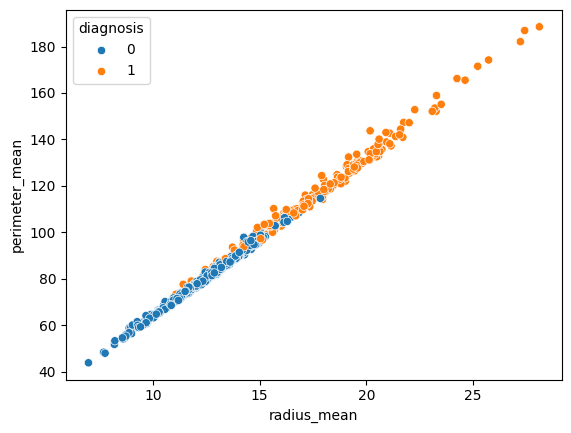

In [29]:
sns.scatterplot(x=dfSelected['radius_mean'], y=dfSelected['perimeter_mean'], hue=dfSelected['diagnosis']) #  1 Maligno, 0 Benigno

<Figure size 3200x1800 with 0 Axes>

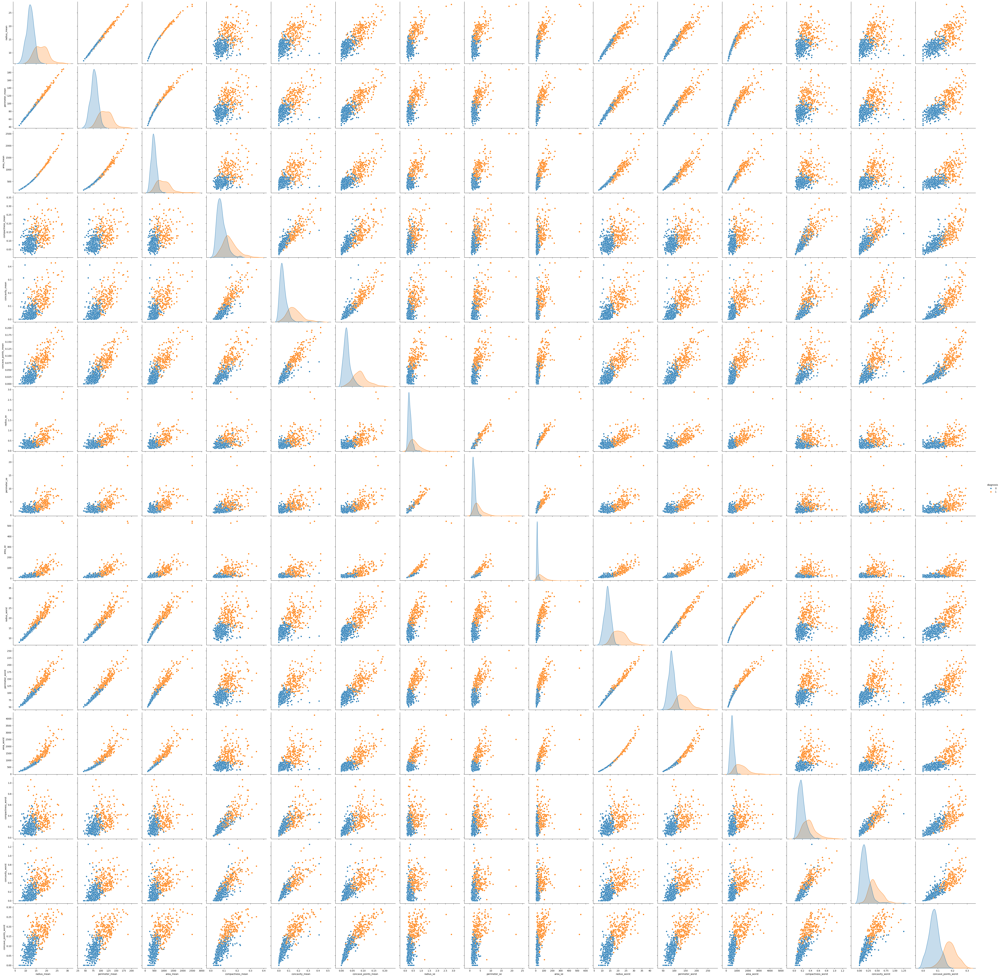

In [30]:
plt.figure(figsize=(32,18))
sns.pairplot(dfSelected,hue='diagnosis',height=4)
plt.show()

In [31]:
## Separacion de datos (caracteristicas y variable objetivo)
X=dfSelected.drop(columns=['diagnosis'])
y=dfSelected['diagnosis']

## Construcción teórica del modelo de aprendizaje automático

Dada la naturaleza binaria del problema diagnóstico (tumor maligno vs. benigno) y la alta dimensionalidad de los atributos nucleares presentes en el dataset de Wisconsin, se propone la evaluación comparativa de un conjunto de modelos clásicos y avanzados de aprendizaje supervisado. Esta estrategia permite identificar el enfoque que optimice la sensibilidad diagnóstica, minimizando falsos negativos y manteniendo una precisión clínica aceptable.

### Modelos seleccionados

1. **Regresión logística:**  
   La regresión logística es un modelo lineal ampliamente utilizado en el ámbito biomédico para la predicción de variables categóricas binarias. Su fortaleza radica en la interpretabilidad de los coeficientes y la facilidad para estimar probabilidades individuales de malignidad, lo que resulta útil en la toma de decisiones clínicas (Mangasarian et al., 1995).

2. **Random Forest:**  
   Los bosques aleatorios constituyen un método de ensamblado basado en la agregación de múltiples árboles de decisión, lo que permite capturar relaciones no lineales y reducir el riesgo de sobreajuste. Este modelo es robusto frente a ruido y variables irrelevantes, y facilita el análisis de la importancia relativa de cada atributo morfológico (Breiman, 2001).

3. **Máquinas de Vectores de Soporte (SVM):**  
   Las SVM, especialmente con kernel lineal, han demostrado un desempeño sobresaliente en tareas de clasificación biomédica, al maximizar el margen entre clases y ser eficientes en espacios de alta dimensión. Su capacidad para manejar casos no separables mediante el uso de kernels las convierte en una herramienta versátil para el diagnóstico automatizado (Cortes y Vapnik, 1995).

4. **K-Nearest Neighbors (KNN):**  
   El algoritmo de los k vecinos más cercanos clasifica nuevas instancias en función de la similitud con ejemplos previamente etiquetados. Es un método no paramétrico, simple y efectivo, aunque su rendimiento puede verse afectado por la presencia de ruido y la escala de las variables.

5. **Naive Bayes:**  
   Este clasificador probabilístico asume independencia condicional entre las características, lo que simplifica el cálculo de probabilidades y permite una rápida inferencia. A pesar de su simplicidad, ha mostrado resultados competitivos en contextos biomédicos con grandes volúmenes de datos (Rish, 2001).

6. **Gradient Boosting:**  
   El método de Gradient Boosting construye modelos aditivos mediante la optimización secuencial de funciones de pérdida, agregando árboles de decisión débiles para corregir errores residuales. Ofrece alta precisión y control sobre el sobreajuste, siendo especialmente útil en conjuntos de datos con relaciones complejas y no lineales (Friedman, 2001).


In [32]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [33]:
modelos={
    "Regresion Logistica": LogisticRegression(max_iter=2000),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42), # 200 arboles
    "SVM":SVC(kernel='linear', probability=True), #hiperplano óptimo para separar clases, estimar probabilidad por clase
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": GaussianNB(),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

resultados={}

### ¿Qué significa cada métrica?
- Accuracy (Exactitud):
Proporción de predicciones correctas sobre el total de casos. Es útil cuando las clases están balanceadas, pero puede ser engañosa si hay desbalance.
- Precision (Precisión):
De todas las muestras clasificadas como positivas, ¿cuántas realmente lo son? Es importante cuando el costo de un falso positivo es alto.
- Recall (Sensibilidad):
De todas las muestras realmente positivas, ¿cuántas fueron identificadas correctamente? Es fundamental en medicina para no dejar pasar casos verdaderos (minimizar falsos negativos).
- F1-score:
Media armónica entre precisión y sensibilidad. Resume ambas métricas en un solo valor.
- AUC ROC (Área bajo la curva ROC):
Mide la capacidad del modelo para distinguir entre clases en todos los umbrales posibles. Un valor de 1 indica separación perfecta, 0.5 indica un modelo aleatorio.
- classification_report:
Muestra precisión, sensibilidad, F1-score y soporte (número de muestras) para cada clase.

Regresion Logistica
AUC ROC (validación cruzada): 0.986 ± 0.009
AUC ROC (test): 0.994
Accuracy: 0.9561
              precision    recall  f1-score   support

     Benigno       0.94      1.00      0.97        72
     Maligno       1.00      0.88      0.94        42

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114



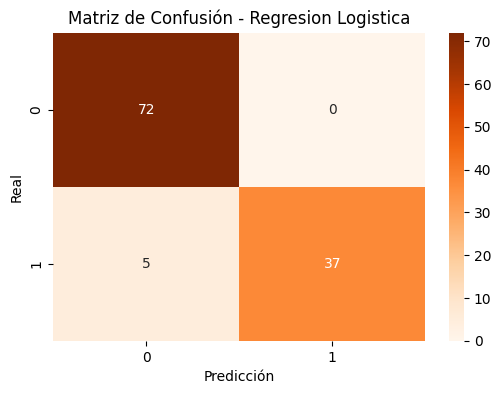

Random Forest
AUC ROC (validación cruzada): 0.986 ± 0.008
AUC ROC (test): 0.992
Accuracy: 0.9561
              precision    recall  f1-score   support

     Benigno       0.94      1.00      0.97        72
     Maligno       1.00      0.88      0.94        42

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114



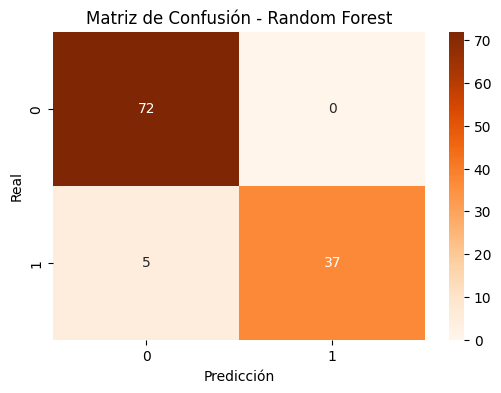

SVM
AUC ROC (validación cruzada): 0.983 ± 0.016
AUC ROC (test): 0.992
Accuracy: 0.9649
              precision    recall  f1-score   support

     Benigno       0.95      1.00      0.97        72
     Maligno       1.00      0.90      0.95        42

    accuracy                           0.96       114
   macro avg       0.97      0.95      0.96       114
weighted avg       0.97      0.96      0.96       114



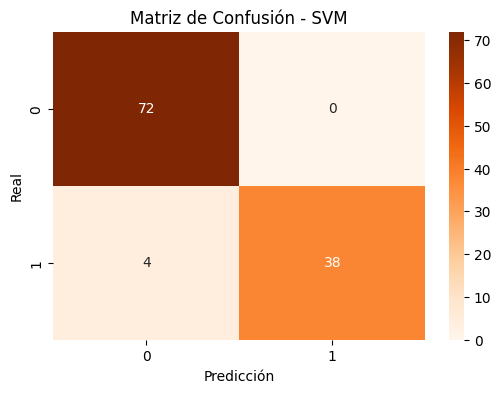

KNN
AUC ROC (validación cruzada): 0.959 ± 0.015
AUC ROC (test): 0.951
Accuracy: 0.9123
              precision    recall  f1-score   support

     Benigno       0.89      0.99      0.93        72
     Maligno       0.97      0.79      0.87        42

    accuracy                           0.91       114
   macro avg       0.93      0.89      0.90       114
weighted avg       0.92      0.91      0.91       114



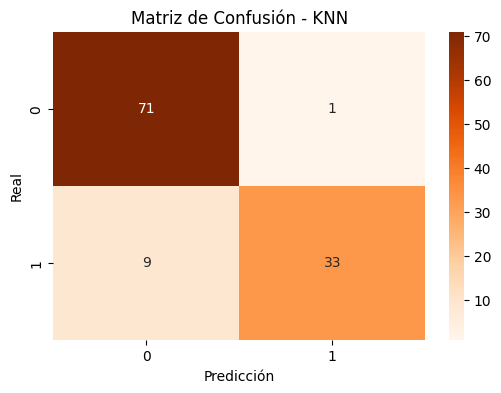

Naive Bayes
AUC ROC (validación cruzada): 0.982 ± 0.011
AUC ROC (test): 0.992
Accuracy: 0.9298
              precision    recall  f1-score   support

     Benigno       0.91      0.99      0.95        72
     Maligno       0.97      0.83      0.90        42

    accuracy                           0.93       114
   macro avg       0.94      0.91      0.92       114
weighted avg       0.93      0.93      0.93       114



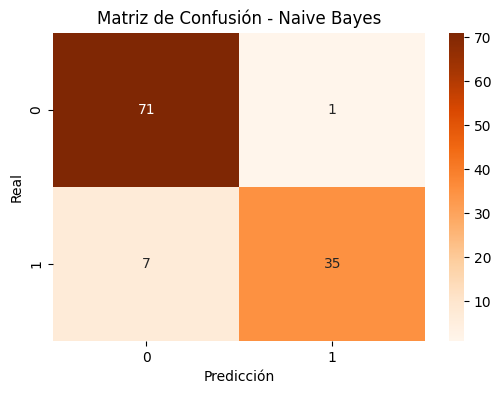

Gradient Boosting
AUC ROC (validación cruzada): 0.985 ± 0.008
AUC ROC (test): 0.992
Accuracy: 0.9561
              precision    recall  f1-score   support

     Benigno       0.94      1.00      0.97        72
     Maligno       1.00      0.88      0.94        42

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114



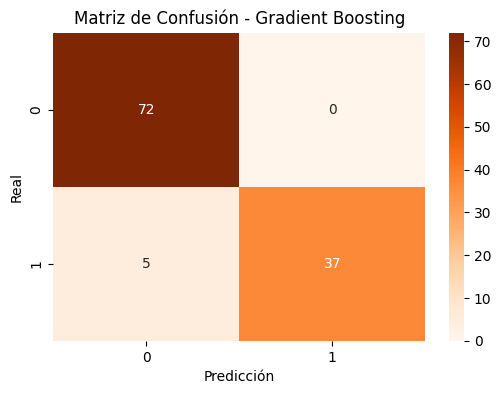

In [34]:
# Validación cruzada y evaluación
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for nombre, modelo in modelos.items():
    modelo.fit(X_train, y_train) #entrenamiento
    y_pred = modelo.predict(X_test) #prueba
    y_proba = modelo.predict_proba(X_test)[:,1] if hasattr(modelo, "predict_proba") else modelo.decision_function(X_test)
    acc=accuracy_score(y_test, y_pred) #evaluación
    auc_cv = cross_val_score(modelo, X_train, y_train, cv=cv, scoring='roc_auc') # Validación cruzada (AUC)
    
    print(nombre)
    print(f"AUC ROC (validación cruzada): {auc_cv.mean():.3f} ± {auc_cv.std():.3f}")
    print(f"AUC ROC (test): {roc_auc_score(y_test, y_proba):.3f}")
    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, target_names=['Benigno', 'Maligno']))
    
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap="Oranges")
    plt.title(f'Matriz de Confusión - {nombre}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.show()
    resultados[nombre] = acc

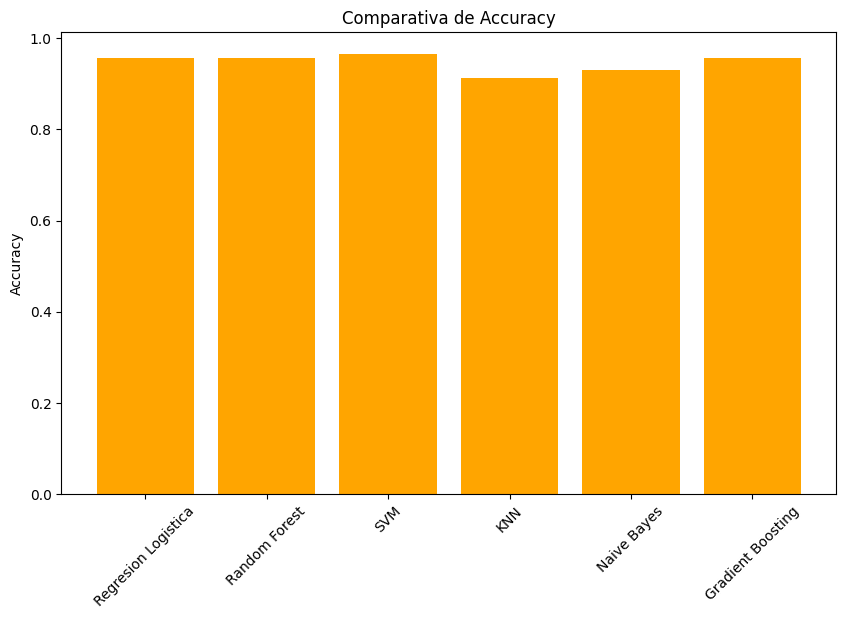

In [35]:
# comparativa
plt.figure(figsize=(10,6))
plt.bar(resultados.keys(), resultados.values(), color="orange")
plt.ylabel("Accuracy")
plt.title("Comparativa de Accuracy")
plt.xticks(rotation=45)
plt.show()

In [37]:
mejorModelo=max(resultados, key=resultados.get)
mejorAccuracy=resultados[mejorModelo]

print(f"El mejor modelo es {mejorModelo} y tiene un Accuracy (Exactitud) de {mejorAccuracy}")
print("El modelo de regresión logística destaca con un área bajo la curva de 0.994")


El mejor modelo es SVM y tiene un Accuracy (Exactitud) de 0.9649122807017544
El modelo de regresión logística destaca con un área bajo la curva de 0.994


### Justificación y metodología

La selección de estos modelos responde a la necesidad de comparar enfoques lineales, no lineales, probabilísticos y de ensamblado, con el objetivo de identificar el algoritmo que maximice la sensibilidad (recall) y precisión en la clasificación de tumores mamarios. El procedimiento metodológico contempla:

- **Preprocesamiento de datos:** conversión de la variable objetivo a formato binario, manejo de valores atípicos y escalado de características.
- **División estratificada del dataset:** en subconjuntos de entrenamiento y prueba (80/20).
- **Entrenamiento y ajuste de hiperparámetros:** empleando validación cruzada para evitar sobreajuste.
- **Evaluación de desempeño:** mediante métricas de sensibilidad, precisión, F1-score y área bajo la curva ROC.

Esta aproximación integral permite seleccionar el modelo óptimo para la detección temprana de cáncer de mama, contribuyendo a la reducción de errores diagnósticos y mejorando el pronóstico clínico de las pacientes.

## Referencias bibliográficas

- American Cancer Society (ACS). (2023). *Breast Cancer Facts & Figures*.
- Breiman, L. Random Forests. *Machine Learning*, 2001, vol. 45, núm. 1, pp. 5-32. DOI: 10.1023/A:1010933404324.
- Cortes, C.; Vapnik, V. Support-Vector Networks. *Machine Learning*, 1995, vol. 20, pp. 273–297. DOI: 10.1007/BF00994018.
- Friedman, J. H. Greedy Function Approximation: A Gradient Boosting Machine. *Annals of Statistics*, 2001, vol. 29, núm. 5, pp. 1189–1232. DOI: 10.1214/aos/1013203451.
- Mangasarian, O. L., Street, W. N., & Wolberg, W. H. Breast Cancer Diagnosis and Prognosis via Linear Programming. *Operations Research*, 1995, vol. 43, núm. 4, pp. 570–577.
- National Comprehensive Cancer Network (NCCN). (2022). *Guidelines for Breast Cancer Screening*.
- Rish, I. An empirical study of the naive Bayes classifier. In: *IJCAI 2001 Workshop on Empirical Methods in Artificial Intelligence*. 2001, vol. 3, pp. 41-46.
- Sung, H., Ferlay, J., Siegel, R. L., Laversanne, M., Soerjomataram, I., Jemal, A., & Bray, F. Global Cancer Statistics 2020: GLOBOCAN Estimates of Incidence and Mortality Worldwide for 36 Cancers in 185 Countries. *CA: A Cancer Journal for Clinicians*, 2021, vol. 71, núm. 3, pp. 209–249. DOI: 10.3322/caac.21660.
- Wolberg, W. H., Street, N., & Mangasarian, O. L. (1995). *Breast Cancer Wisconsin (Diagnostic) Dataset*. University of Wisconsin, Madison; Disponible en: [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)).